#**Import and install dependencies on colab**

In [1]:
!pip install umap-learn
!pip install phate scprep s_gd2
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn import decomposition
cmap='BuGn_r'
lol= ['#a61551','#d9424d','#f67b4a','#febf6f','#feefa4','#f2f9a9','#bee5a0','#75c8a5','#388eba','#5e50a2']


MNIST DATA SET

In [77]:
import s_gd2
from scipy.spatial.distance import pdist, squareform

In [2]:

sns.set(context="paper", style="white")

SGD ALGORITHM

In [3]:
import s_gd2
from scipy.spatial.distance import pdist, squareform

In [78]:
def sgd(D, n_components=2, random_state=None, init=None,num_dimensions=None):
    """Metric MDS using stochastic gradient descent
    Parameters
    ----------
    D : array-like, shape=[n_samples, n_samples]
        pairwise distances
    n_components : int, optional (default: 2)
        number of dimensions in which to embed `D`
    random_state : int or None, optional (default: None)
        numpy random state
    init : array-like or None
        Initialization algorithm or state to use for MMDS
    Returns
    -------
    Y : array-like, embedded data [n_sample, ndim]
    """

    N = D.shape[0]
    D = squareform(D)
    # Metric MDS from s_gd2
    Y = s_gd2.mds_direct(N, D, init=init, random_seed=random_state,num_dimensions=num_dimensions)
    return Y

PCA

VISUALAZING PICTURES

#**PCA manifold**

#**Real data**

In [7]:
import pandas as pd
import numpy as np
import os
#count matrix
!gdown --id 10AUDnRh7mitOBOQzo0DLLict_EnlpbtG
!gdown --id 17h8H0axCYGNE5XEkupb6LGNQUFx06Pvd

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=10AUDnRh7mitOBOQzo0DLLict_EnlpbtG
From (redirected): https://drive.google.com/uc?id=10AUDnRh7mitOBOQzo0DLLict_EnlpbtG&confirm=t&uuid=601b2d0a-5387-4aa5-b182-e629aa812b2e
To: /content/expression_matrix.txt
100% 126M/126M [00:02<00:00, 53.9MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=17h8H0axCYGNE5XEkupb6LGNQUFx06Pvd
To: /content/clusters.txt
100% 52.6k/52.6k [00:00<00:00, 4.47MB/s]


In [8]:
#este funciona
data = pd.read_table('expression_matrix.txt')
data = data.set_index('Unnamed: 0')
data = data.T
data

Unnamed: 0,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,mt_DQ540229,mt_DQ719271,mt_DQ719488,mt_DQ725839,mt_EF437370,mt_FR668231,mt_FW313083,mt_GU332589,mt_X57779,mt_X57780
A01101401,0.0,76.13,0.05,0.0,0.00,0.00,0.00,0.0,0.0,0.09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1401.76,242.94,242.94
A01101402,0.0,512.73,10.11,0.0,0.00,146.61,0.00,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1397.16,539.54,539.54
A01101403,0.0,172.75,0.00,0.0,0.00,23.65,0.00,0.0,0.0,72.72,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,332.88,341.45,341.45
A01101404,0.0,170.56,0.02,0.0,0.00,117.60,0.00,0.0,0.0,125.81,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1442.66,260.02,260.02
A01101405,0.0,113.87,0.04,0.0,0.00,180.93,0.00,0.0,0.0,0.10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,749.68,348.10,348.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Z11041427,0.0,106.52,0.00,0.0,0.08,221.36,0.00,0.0,0.0,141.14,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1514.75,433.01,433.01
Z11041428,0.0,349.73,0.00,0.0,0.00,262.66,88.02,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1949.32,787.32,787.32
Z11041429,0.0,1.54,1.17,0.0,0.00,219.92,0.00,0.0,0.0,94.38,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1829.42,506.35,506.35
Z11041430,0.0,0.54,7.65,0.0,43.42,272.64,0.00,0.0,0.0,78.25,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1275.09,709.91,709.91


In [43]:
clusters = pd.read_table('clusters.txt',skiprows=1)
clusters = clusters.set_index('TYPE')
clusters

,group,group.1
TYPE,,
A01101401,GABA_Vip,Vip_Mybpc1
A01101402,GABA_Vip,Vip_Parm1
A01101403,Gluta_L4,L4_Ctxn3
A01101404,GABA_Vip,Vip_Chat
A01101405,GABA_Vip,Vip_Parm1
...,...,...
Z11041427,GABA_Vip,Vip_Chat
Z11041428,GABA_Vip,Vip_Chat
Z11041429,GABA_Vip,Vip_Chat


In [13]:
clusters.group

0       GABA_Vip
1       GABA_Vip
2       Gluta_L4
3       GABA_Vip
4       GABA_Vip
          ...   
1674    GABA_Vip
1675    GABA_Vip
1676    GABA_Vip
1677    GABA_Vip
1678    GABA_Vip
Name: group, Length: 1679, dtype: object

In [34]:
data

Unnamed: 0,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,mt_DQ540229,mt_DQ719271,mt_DQ719488,mt_DQ725839,mt_EF437370,mt_FR668231,mt_FW313083,mt_GU332589,mt_X57779,mt_X57780
A01101401,0.0,76.13,0.05,0.0,0.00,0.00,0.00,0.0,0.0,0.09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1401.76,242.94,242.94
A01101402,0.0,512.73,10.11,0.0,0.00,146.61,0.00,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1397.16,539.54,539.54
A01101403,0.0,172.75,0.00,0.0,0.00,23.65,0.00,0.0,0.0,72.72,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,332.88,341.45,341.45
A01101404,0.0,170.56,0.02,0.0,0.00,117.60,0.00,0.0,0.0,125.81,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1442.66,260.02,260.02
A01101405,0.0,113.87,0.04,0.0,0.00,180.93,0.00,0.0,0.0,0.10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,749.68,348.10,348.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Z11041427,0.0,106.52,0.00,0.0,0.08,221.36,0.00,0.0,0.0,141.14,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1514.75,433.01,433.01
Z11041428,0.0,349.73,0.00,0.0,0.00,262.66,88.02,0.0,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1949.32,787.32,787.32
Z11041429,0.0,1.54,1.17,0.0,0.00,219.92,0.00,0.0,0.0,94.38,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1829.42,506.35,506.35
Z11041430,0.0,0.54,7.65,0.0,43.42,272.64,0.00,0.0,0.0,78.25,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1275.09,709.91,709.91


In [ ]:
data.

In [29]:
from sklearn.decomposition import PCA
pca = PCA(n_components=500, random_state=1)
pca_data= pca.fit_transform(data)

In [30]:
import umap
fit = umap.UMAP(n_neighbors=10, verbose= True, metric='cosine', min_dist=0.5, n_epochs=1500, negative_sample_rate=5, set_op_mix_ratio=0.8, learning_rate=0.1 , local_connectivity=3, random_state=42)
%time u_no = fit.fit_transform(data)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(angular_rp_forest=True, learning_rate=0.1, local_connectivity=3, metric='cosine', min_dist=0.5, n_epochs=1500, n_jobs=1, n_neighbors=10, random_state=42, set_op_mix_ratio=0.8, verbose=True)
Tue May 21 21:47:35 2024 Construct fuzzy simplicial set
Tue May 21 21:48:46 2024 Finding Nearest Neighbors
Tue May 21 21:48:46 2024 Finished Nearest Neighbor Search
Tue May 21 21:48:46 2024 Construct embedding


Epochs completed:   0%|            0/1500 [00:00]

	completed  0  /  1500 epochs
	completed  150  /  1500 epochs
	completed  300  /  1500 epochs
	completed  450  /  1500 epochs
	completed  600  /  1500 epochs
	completed  750  /  1500 epochs
	completed  900  /  1500 epochs
	completed  1050  /  1500 epochs
	completed  1200  /  1500 epochs
	completed  1350  /  1500 epochs
Tue May 21 21:48:55 2024 Finished embedding
CPU times: user 1min 19s, sys: 439 ms, total: 1min 20s
Wall time: 1min 20s


In [38]:
umap2d = pd.DataFrame(u_no, index=data.index, columns=['UMAP1', 'UMAP2'])

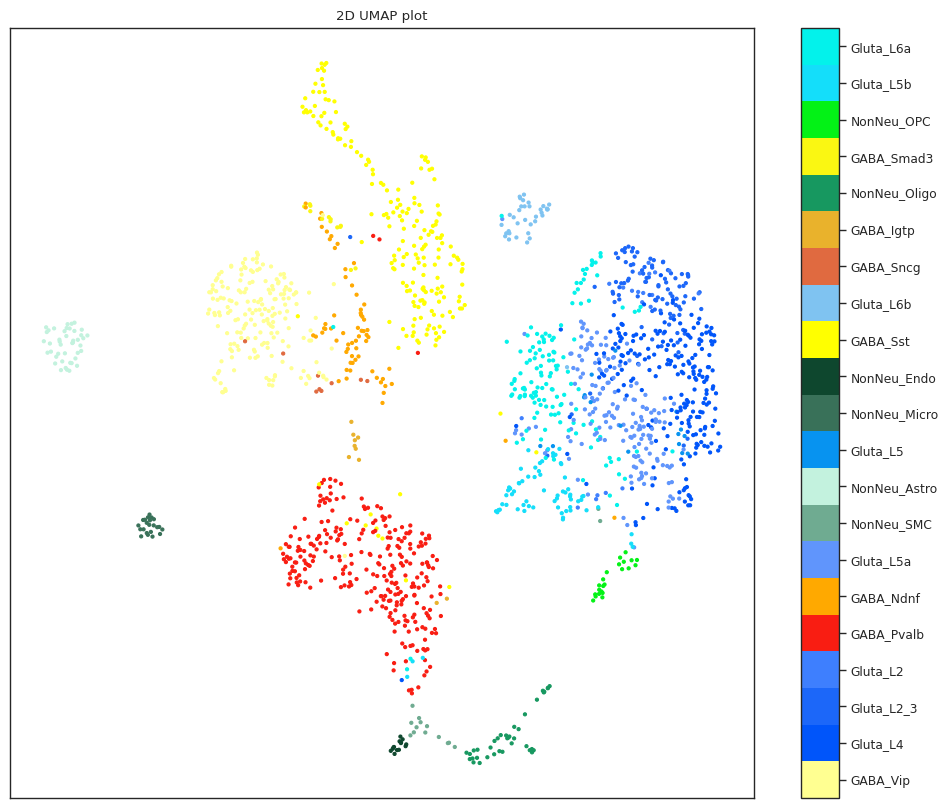

In [48]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pandas as pd


umap_df = umap2d
clusters_df =clusters

# Preparar el mapeo de colores
target = clusters_df['group']
list_clust = list(np.arange(len(clusters_df['group'].unique())))
lut = dict(zip(clusters_df['group'].unique(), list_clust))
row_colors = target.map(lut)

all_label_1 = ['GABA_Vip', 'Gluta_L4', 'Gluta_L2_3', 'Gluta_L2', 'GABA_Pvalb',
               'GABA_Ndnf', 'Gluta_L5a', 'NonNeu_SMC', 'NonNeu_Astro', 'Gluta_L5',
               'NonNeu_Micro', 'NonNeu_Endo', 'GABA_Sst', 'Gluta_L6b',
               'GABA_Sncg', 'GABA_Igtp', 'NonNeu_Oligo', 'GABA_Smad3',
               'NonNeu_OPC', 'Gluta_L5b', 'Gluta_L6a']

all_label = ['#FFFF91', '#0055FA', '#1C67F9', '#3E7FFE', '#F91D12',
             '#FFA900', '#6095FC', '#6FAB91', '#C3F2DE', '#0793F0',
             '#397159', '#0E472E', '#FFFF00', '#7FC3F1',
             '#E06A40', '#E9B22C', '#179860', '#FAF712',
             '#03F216', '#14DEFA', '#03F2EB']

cmap = ListedColormap(['#FFFF91', '#0055FA', '#1C67F9', '#3E7FFE', '#F91D12',
                       '#FFA900', '#6095FC', '#6FAB91', '#C3F2DE', '#0793F0',
                       '#397159', '#0E472E', '#FFFF00', '#7FC3F1',
                       '#E06A40', '#E9B22C', '#179860', '#FAF712',
                       '#03F216', '#14DEFA', '#03F2EB'])

# Crear la visualización de UMAP
fig, ax = plt.subplots(figsize=(12, 10))
scatter = ax.scatter(umap_df['UMAP1'], umap_df['UMAP2'], c=row_colors, cmap=cmap, s=5)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(scatter, ax=ax, boundaries=np.arange(22)-0.5)
cbar.set_ticks(np.arange(21))
cbar.set_ticklabels(all_label_1)
plt.title('2D UMAP plot')
plt.show()


In [51]:
clusters_df

,group,group.1
TYPE,,
A01101401,GABA_Vip,Vip_Mybpc1
A01101402,GABA_Vip,Vip_Parm1
A01101403,Gluta_L4,L4_Ctxn3
A01101404,GABA_Vip,Vip_Chat
A01101405,GABA_Vip,Vip_Parm1
...,...,...
Z11041427,GABA_Vip,Vip_Chat
Z11041428,GABA_Vip,Vip_Chat
Z11041429,GABA_Vip,Vip_Chat


In [ ]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pandas as pd
from sklearn.metrics import adjusted_rand_score
from tqdm import tqdm


#PCA CLASSIFICATOR for main text

Visualizing PCA Diffusion:   0%|          | 0/20 [00:00<?, ?it/s]<ipython-input-131-8b154bb3aed5>:38: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
Visualizing PCA Diffusion:   5%|▌         | 1/20 [00:21<06:54, 21.83s/it]<ipython-input-131-8b154bb3aed5>:38: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
Visualizing PCA Diffusion:  10%|█         | 2/20 [00:40<06:01, 20.10s/it]<ipython-input-131-8b154bb3aed5>:38: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
Visualizing PCA Diffusion:  15%|█▌        | 3/20 [01:05<06:18, 22.28s/it]<ipython-input-131-8b154bb3aed5>:38: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
Visualizing PCA Diffusion:  20%|██        | 4/20 [01:30<06:10, 23.18s/it]<ipython-input-131-8b154bb3aed5>:38: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
Visualizing PCA Diffusion:  

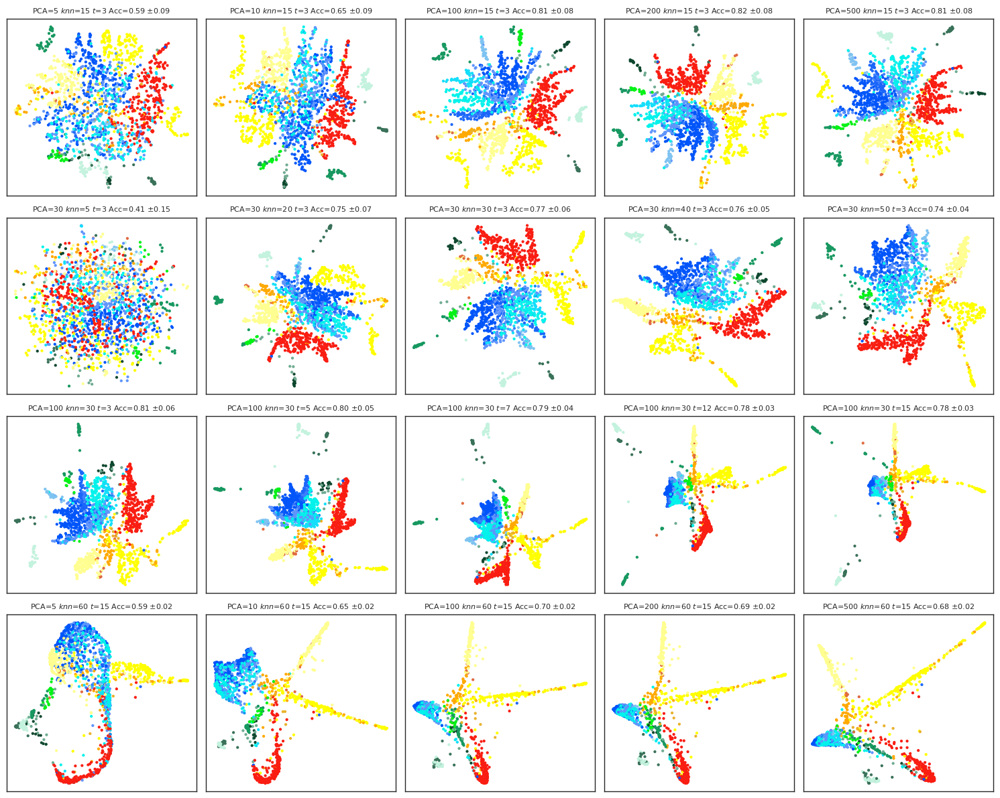

In [131]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm
import umap
import s_gd2  # Assuming s_gd2 is available as a module

def sgd(D, n_components=2, random_state=1, init=None, num_dimensions=None):
    N = D.shape[0]
    D = squareform(D)
    Y = s_gd2.mds_direct(N, D, init=init, random_seed=random_state)
    return Y

def pca_diffusion(data, n_components=10, knn=30, decay=15, t=5, random_state=1):
    pca = PCA(n_components=n_components, random_state=random_state)
    pca_data = pca.fit_transform(data)
    """
    fit = umap.UMAP(n_components=20, n_neighbors=5, verbose=1, metric='cosine',
                    min_dist=0.5, n_epochs=521, negative_sample_rate=1, set_op_mix_ratio=0.6,
                    local_connectivity=1, learning_rate=1, random_state=42)
    umap_data = fit.fit_transform(pca_data)
    """
    distance_matrix_dist = pdist(pca_data)
    distance_matrix_u_pca = squareform(distance_matrix_dist)

    n, m = distance_matrix_u_pca.shape
    E = np.zeros((m, m))

    knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    epsilon = knn_dst[:, knn]

    pdx_scale = (distance_matrix_u_pca / epsilon).T
    E = np.exp(-1 * (pdx_scale ** decay))

    A = (E + E.T)

    diff_deg = np.diag(np.sum(A, 0))
    diff_op = np.dot(np.diag(np.diag(diff_deg) ** (-1)), A)

    new_matrix_pca_neuro = np.linalg.matrix_power(diff_op, t)

    distance_matrix_dist_neuro = pdist(new_matrix_pca_neuro)
    distance_matrix_pca_diff_neuro = squareform(distance_matrix_dist_neuro)

    PCA_diff_2D_MSD_sdg_neu = sgd(distance_matrix_pca_diff_neuro)

    return PCA_diff_2D_MSD_sdg_neu

def visualize_and_evaluate_pca_diffusion(data, cluster_data, pca_components, knn, decay, t, random_state=1):
    cmap = ListedColormap(['#FFFF91', '#0055FA', '#1C67F9', '#3E7FFE', '#F91D12',
                           '#FFA900', '#6095FC', '#6FAB91', '#C3F2DE', '#0793F0',
                           '#397159', '#0E472E', '#FFFF00', '#7FC3F1',
                           '#E06A40', '#E9B22C', '#179860', '#FAF712',
                           '#03F216', '#14DEFA', '#03F2EB'])

    target = cluster_data['group']
    n_clusters = len(np.unique(target))
    list_clust = list(np.arange(n_clusters))
    lut = dict(zip(cluster_data['group'].unique(), list_clust))
    row_colors = target.map(lut)

    num_combinations = len(pca_components)
    num_cols = 5
    num_rows = (num_combinations + num_cols - 1) // num_cols  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 12))
    axs = axs.flatten()

    with tqdm(total=num_combinations, desc="Visualizing PCA Diffusion") as pbar:
        for i, (pc, k, ti) in enumerate(zip(pca_components, knn, t)):
            umap_2d = pca_diffusion(data, n_components=pc, knn=k, decay=decay, t=ti, random_state=random_state)
            umap_df = pd.DataFrame(umap_2d, columns=['UMAP1', 'UMAP2'])

            # Fit KNN classifier using all data
            knn_classifier = KNeighborsClassifier(n_neighbors=30)
            knn_classifier.fit(umap_2d, target)

            # Make predictions using all data
            y_pred = knn_classifier.predict(umap_2d)

            # Calculate mean accuracy per class
            report = classification_report(target, y_pred, output_dict=True)
            accuracies = [report[str(cls)]['precision'] for cls in np.unique(target)]

            # Calculate overall mean accuracy and standard deviation
            mean_accuracy = np.mean(accuracies)
            std_dev_accuracy = np.std(accuracies)

            title = f'PCA={pc} $knn$={k} $t$={ti} Acc={mean_accuracy:.2f} ±{std_dev_accuracy:.2f}'
            axs[i].scatter(umap_df['UMAP1'], umap_df['UMAP2'], c=row_colors, cmap=cmap, s=5)
            axs[i].set_title(title, fontsize=8)
            axs[i].set_xticks([])
            axs[i].set_yticks([])

            pbar.update(1)

    for j in range(num_combinations, num_rows * num_cols):
        fig.delaxes(axs[j])  # Remove empty subplots

    plt.tight_layout()
    plt.show()

    # Save the figure
    fig.savefig('pca_diffusion_visualization.png')

# Defining the combinations
pca_components_1 = [5, 10, 100, 200, 500]
knn_2 = [5, 20, 30, 40, 50]
t_3 = [3, 5, 7, 12, 15]
pca_components_4 = [5, 10, 100, 200, 500]

knn_values = [15] * 5 + knn_2 + [30] * 5 + [60] * 5
t_values = [3] * 10 + t_3 + [15] * 5 + [30] * 5

all_pca_components = pca_components_1 + [30] * 5 + [100] * 5 + pca_components_4

# Example usage:
data = data  # Your input data
cluster_data = clusters_df
visualize_and_evaluate_pca_diffusion(data, cluster_data, all_pca_components, knn_values, decay=500, t=t_values, random_state=1)


more combinations of parameters

Visualizing PCA Diffusion:   0%|          | 0/125 [00:00<?, ?it/s]<ipython-input-138-18a5fd47279c>:34: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predi

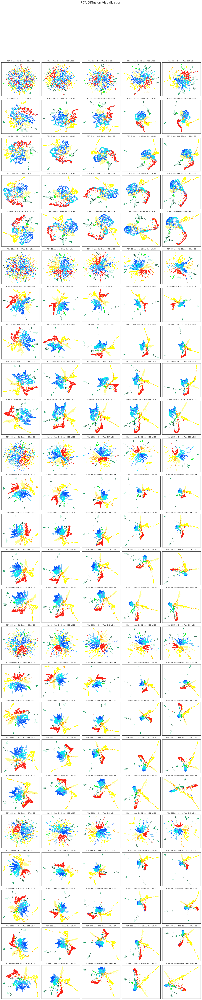

In [138]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm
import umap
import s_gd2  # Assuming s_gd2 is available as a module
import itertools

def sgd(D, n_components=2, random_state=1, init=None, num_dimensions=None):
    N = D.shape[0]
    D = squareform(D)
    Y = s_gd2.mds_direct(N, D, init=init, random_seed=random_state)
    return Y

def pca_diffusion(data, n_components=10, knn=30, decay=15, t=5, random_state=1):
    pca = PCA(n_components=n_components, random_state=random_state)
    pca_data = pca.fit_transform(data)

    distance_matrix_dist = pdist(pca_data)
    distance_matrix_u_pca = squareform(distance_matrix_dist)

    n, m = distance_matrix_u_pca.shape
    E = np.zeros((m, m))

    knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    epsilon = knn_dst[:, knn]

    pdx_scale = (distance_matrix_u_pca / epsilon).T
    E = np.exp(-1 * (pdx_scale ** decay))

    A = (E + E.T)

    diff_deg = np.diag(np.sum(A, 0))
    diff_op = np.dot(np.diag(np.diag(diff_deg) ** (-1)), A)

    new_matrix_pca_neuro = np.linalg.matrix_power(diff_op, t)

    distance_matrix_dist_neuro = pdist(new_matrix_pca_neuro)
    distance_matrix_pca_diff_neuro = squareform(distance_matrix_dist_neuro)

    PCA_diff_2D_MSD_sdg_neu = sgd(distance_matrix_pca_diff_neuro)

    return PCA_diff_2D_MSD_sdg_neu

def visualize_and_evaluate_pca_diffusion(data, cluster_data, combinations, decay=500, random_state=1, save_path='pca_diffusion_visualization.png', title='PCA Diffusion Visualization', dpi=300):
    cmap = ListedColormap(['#FFFF91', '#0055FA', '#1C67F9', '#3E7FFE', '#F91D12',
                           '#FFA900', '#6095FC', '#6FAB91', '#C3F2DE', '#0793F0',
                           '#397159', '#0E472E', '#FFFF00', '#7FC3F1',
                           '#E06A40', '#E9B22C', '#179860', '#FAF712',
                           '#03F216', '#14DEFA', '#03F2EB'])

    target = cluster_data['group']
    n_clusters = len(np.unique(target))
    list_clust = list(np.arange(n_clusters))
    lut = dict(zip(cluster_data['group'].unique(), list_clust))
    row_colors = target.map(lut)

    num_combinations = len(combinations)
    num_cols = 5
    num_rows = (num_combinations + num_cols - 1) // num_cols  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))
    axs = axs.flatten()

    with tqdm(total=num_combinations, desc="Visualizing PCA Diffusion") as pbar:
        for i, (pc, k, ti) in enumerate(combinations):
            umap_2d = pca_diffusion(data, n_components=pc, knn=k, decay=decay, t=ti, random_state=random_state)
            umap_df = pd.DataFrame(umap_2d, columns=['UMAP1', 'UMAP2'])

            # Fit KNN classifier using all data
            knn_classifier = KNeighborsClassifier(n_neighbors=30)
            knn_classifier.fit(umap_2d, target)

            # Make predictions using all data
            y_pred = knn_classifier.predict(umap_2d)

            # Calculate mean accuracy per class
            report = classification_report(target, y_pred, output_dict=True)
            accuracies = [report[str(cls)]['precision'] for cls in np.unique(target)]

            # Calculate overall mean accuracy and standard deviation
            mean_accuracy = np.mean(accuracies)
            std_dev_accuracy = np.std(accuracies)

            title_subplot = f'PCA={pc} $knn$={k} $t$={ti} Acc={mean_accuracy:.2f} ±{std_dev_accuracy:.2f}'
            axs[i].scatter(umap_df['UMAP1'], umap_df['UMAP2'], c=row_colors, cmap=cmap, s=5)
            axs[i].set_title(title_subplot, fontsize=8)
            axs[i].set_xticks([])
            axs[i].set_yticks([])

            pbar.update(1)

    for j in range(num_combinations, num_rows * num_cols):
        fig.delaxes(axs[j])  # Remove empty subplots

    plt.tight_layout()
    fig.suptitle(title, fontsize=16)
    plt.subplots_adjust(top=0.92)  # Adjust title position
    plt.savefig(save_path, dpi=dpi)
    plt.show()

# Define combinations
pca_components = [5, 10, 100, 200, 500]
knn_values = [5, 20, 30, 40, 50]
t_values = [3, 5, 7, 12, 15]

# Generate all combinations
combinations = list(itertools.product(pca_components, knn_values, t_values))

# Example usage:
data = data  # Your input data
cluster_data = clusters_df
visualize_and_evaluate_pca_diffusion(data, cluster_data, combinations, decay=500, random_state=1, save_path='pca_diffusion_alot_visualization.png', title='PCA Diffusion Visualization', dpi=300)


#PCA-UMAP CLASSIFICATION for main text

Visualizing PCA Diffusion:   0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:35:48 2024 Construct fuzzy simplicial set
Wed May 22 16:35:53 2024 Finding Nearest Neighbors
Wed May 22 16:35:54 2024 Finished Nearest Neighbor Search
Wed May 22 16:35:54 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:36:05 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:36:17 2024 Construct fuzzy simplicial set
Wed May 22 16:36:18 2024 Finding Nearest Neighbors
Wed May 22 16:36:18 2024 Finished Nearest Neighbor Search
Wed May 22 16:36:18 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:36:21 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:36:37 2024 Construct fuzzy simplicial set
Wed May 22 16:36:39 2024 Finding Nearest Neighbors
Wed May 22 16:36:39 2024 Finished Nearest Neighbor Search
Wed May 22 16:36:39 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:36:43 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:37:00 2024 Construct fuzzy simplicial set
Wed May 22 16:37:02 2024 Finding Nearest Neighbors
Wed May 22 16:37:02 2024 Finished Nearest Neighbor Search
Wed May 22 16:37:02 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:37:05 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:37:35 2024 Construct fuzzy simplicial set
Wed May 22 16:37:38 2024 Finding Nearest Neighbors
Wed May 22 16:37:38 2024 Finished Nearest Neighbor Search
Wed May 22 16:37:38 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:37:43 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:37:55 2024 Construct fuzzy simplicial set
Wed May 22 16:37:56 2024 Finding Nearest Neighbors
Wed May 22 16:37:56 2024 Finished Nearest Neighbor Search
Wed May 22 16:37:56 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:38:01 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:38:12 2024 Construct fuzzy simplicial set
Wed May 22 16:38:14 2024 Finding Nearest Neighbors
Wed May 22 16:38:15 2024 Finished Nearest Neighbor Search
Wed May 22 16:38:15 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:38:18 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:38:31 2024 Construct fuzzy simplicial set
Wed May 22 16:38:32 2024 Finding Nearest Neighbors
Wed May 22 16:38:33 2024 Finished Nearest Neighbor Search
Wed May 22 16:38:33 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:38:36 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:38:48 2024 Construct fuzzy simplicial set
Wed May 22 16:38:50 2024 Finding Nearest Neighbors
Wed May 22 16:38:50 2024 Finished Nearest Neighbor Search
Wed May 22 16:38:50 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:38:53 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:39:05 2024 Construct fuzzy simplicial set
Wed May 22 16:39:07 2024 Finding Nearest Neighbors
Wed May 22 16:39:07 2024 Finished Nearest Neighbor Search
Wed May 22 16:39:07 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:39:10 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:39:26 2024 Construct fuzzy simplicial set
Wed May 22 16:39:30 2024 Finding Nearest Neighbors
Wed May 22 16:39:30 2024 Finished Nearest Neighbor Search
Wed May 22 16:39:30 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:39:33 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:39:50 2024 Construct fuzzy simplicial set
Wed May 22 16:39:52 2024 Finding Nearest Neighbors
Wed May 22 16:39:52 2024 Finished Nearest Neighbor Search
Wed May 22 16:39:52 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:39:56 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:40:14 2024 Construct fuzzy simplicial set
Wed May 22 16:40:16 2024 Finding Nearest Neighbors
Wed May 22 16:40:16 2024 Finished Nearest Neighbor Search
Wed May 22 16:40:16 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:40:19 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:40:36 2024 Construct fuzzy simplicial set
Wed May 22 16:40:38 2024 Finding Nearest Neighbors
Wed May 22 16:40:38 2024 Finished Nearest Neighbor Search
Wed May 22 16:40:38 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:40:41 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:40:59 2024 Construct fuzzy simplicial set
Wed May 22 16:41:01 2024 Finding Nearest Neighbors
Wed May 22 16:41:01 2024 Finished Nearest Neighbor Search
Wed May 22 16:41:01 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:41:04 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:41:15 2024 Construct fuzzy simplicial set
Wed May 22 16:41:17 2024 Finding Nearest Neighbors
Wed May 22 16:41:17 2024 Finished Nearest Neighbor Search
Wed May 22 16:41:17 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:41:21 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:41:34 2024 Construct fuzzy simplicial set
Wed May 22 16:41:35 2024 Finding Nearest Neighbors
Wed May 22 16:41:35 2024 Finished Nearest Neighbor Search
Wed May 22 16:41:35 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:41:38 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:41:57 2024 Construct fuzzy simplicial set
Wed May 22 16:41:59 2024 Finding Nearest Neighbors
Wed May 22 16:42:00 2024 Finished Nearest Neighbor Search
Wed May 22 16:42:00 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:42:03 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:42:19 2024 Construct fuzzy simplicial set
Wed May 22 16:42:21 2024 Finding Nearest Neighbors
Wed May 22 16:42:22 2024 Finished Nearest Neighbor Search
Wed May 22 16:42:22 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:42:27 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:42:58 2024 Construct fuzzy simplicial set
Wed May 22 16:43:00 2024 Finding Nearest Neighbors
Wed May 22 16:43:01 2024 Finished Nearest Neighbor Search
Wed May 22 16:43:01 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:43:04 2024 Finished embedding


<ipython-input-136-db42b1493e55>:40: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

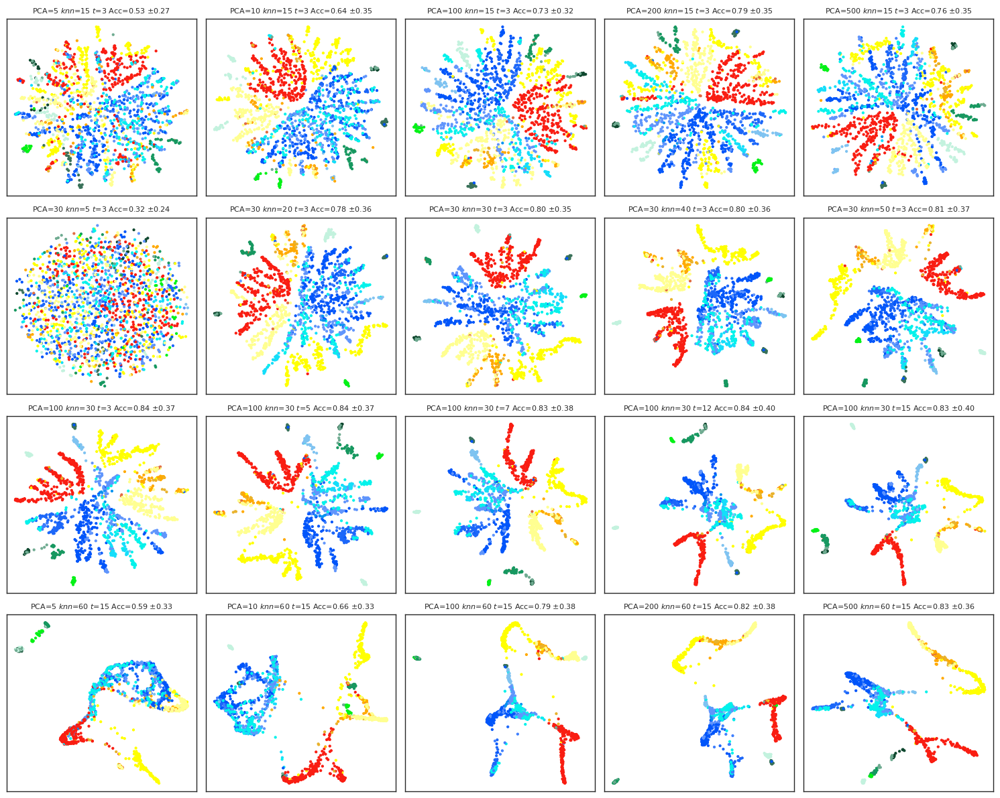

In [136]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pandas as pd
from sklearn.metrics import classification_report, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm
import umap
import s_gd2  # Assuming s_gd2 is available as a module

def sgd(D, n_components=2, random_state=1, init=None, num_dimensions=None):
    N = D.shape[0]
    D = squareform(D)
    Y = s_gd2.mds_direct(N, D, init=init, random_seed=random_state)
    return Y

def pca_diffusion(data, n_components=10, knn=30, decay=15, t=5, random_state=1):
    # Perform PCA
    pca = PCA(n_components=n_components, random_state=random_state)
    pca_data = pca.fit_transform(data)

    # Perform UMAP
    fit = umap.UMAP(n_components=20, n_neighbors=5, verbose=1, metric='cosine',
                    min_dist=0.5, n_epochs=521, negative_sample_rate=1, set_op_mix_ratio=0.6,
                    local_connectivity=1, learning_rate=1, random_state=42)
    umap_data = fit.fit_transform(pca_data)

    distance_matrix_dist = pdist(umap_data)
    distance_matrix_u_pca = squareform(distance_matrix_dist)

    n, m = distance_matrix_u_pca.shape
    E = np.zeros((m, m))

    knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    epsilon = knn_dst[:, knn]

    pdx_scale = (distance_matrix_u_pca / epsilon).T
    E = np.exp(-1 * (pdx_scale ** decay))

    A = (E + E.T)

    diff_deg = np.diag(np.sum(A, 0))
    diff_op = np.dot(np.diag(np.diag(diff_deg) ** (-1)), A)

    new_matrix_pca_neuro = np.linalg.matrix_power(diff_op, t)

    distance_matrix_dist_neuro = pdist(new_matrix_pca_neuro)
    distance_matrix_pca_diff_neuro = squareform(distance_matrix_dist_neuro)

    PCA_diff_2D_MSD_sdg_neu = sgd(distance_matrix_pca_diff_neuro)

    return PCA_diff_2D_MSD_sdg_neu

def visualize_and_evaluate_pca_diffusion(data, cluster_data, pca_components, knn, decay, t, random_state=1):
    cmap = ListedColormap(['#FFFF91', '#0055FA', '#1C67F9', '#3E7FFE', '#F91D12',
                           '#FFA900', '#6095FC', '#6FAB91', '#C3F2DE', '#0793F0',
                           '#397159', '#0E472E', '#FFFF00', '#7FC3F1',
                           '#E06A40', '#E9B22C', '#179860', '#FAF712',
                           '#03F216', '#14DEFA', '#03F2EB'])

    target = cluster_data['group']
    n_clusters = len(np.unique(target))
    list_clust = list(np.arange(n_clusters))
    lut = dict(zip(cluster_data['group'].unique(), list_clust))
    row_colors = target.map(lut)

    num_combinations = len(pca_components)
    num_cols = 5
    num_rows = (num_combinations + num_cols - 1) // num_cols  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 12))
    axs = axs.flatten()

    with tqdm(total=num_combinations, desc="Visualizing PCA Diffusion") as pbar:
        for i, (pc, k, ti) in enumerate(zip(pca_components, knn, t)):
            umap_2d = pca_diffusion(data, n_components=pc, knn=k, decay=decay, t=ti, random_state=random_state)
            umap_df = pd.DataFrame(umap_2d, columns=['UMAP1', 'UMAP2'])

            # Fit KNN classifier using all data
            knn_classifier = KNeighborsClassifier(n_neighbors=30)
            knn_classifier.fit(umap_2d, target)

            # Make predictions using all data
            y_pred = knn_classifier.predict(umap_2d)

            # Calculate overall accuracy
            accuracy = accuracy_score(target, y_pred)

            # Calculate mean accuracy per class
            report = classification_report(target, y_pred, output_dict=True)
            accuracies = [report[str(cls)]['precision'] for cls in np.unique(target)]

            # Calculate overall mean accuracy and standard deviation
            mean_accuracy = np.mean(accuracies)
            std_dev_accuracy = np.std(accuracies)

            title = f'PCA={pc} $knn$={k} $t$={ti} Acc={accuracy:.2f} ±{std_dev_accuracy:.2f}'
            axs[i].scatter(umap_df['UMAP1'], umap_df['UMAP2'], c=row_colors, cmap=cmap, s=5)
            axs[i].set_title(title, fontsize=8)
            axs[i].set_xticks([])
            axs[i].set_yticks([])

            pbar.update(1)

    for j in range(num_combinations, num_rows * num_cols):
        fig.delaxes(axs[j])  # Remove empty subplots

    plt.tight_layout()
    plt.show()

    # Save the figure
    fig.savefig('pca_diffusion_visualization.png')

# Defining the combinations
pca_components_1 = [5, 10, 100, 200, 500]
knn_2 = [5, 20, 30, 40, 50]
t_3 = [3, 5, 7, 12, 15]
pca_components_4 = [5, 10, 100, 200, 500]

knn_values = [15] * 5 + knn_2 + [30] * 5 + [60] * 5
t_values = [3] * 10 + t_3 + [15] * 5 + [30] * 5

all_pca_components = pca_components_1 + [30] * 5 + [100] * 5 + pca_components_4

# Example usage:
data = data  # Your input data
cluster_data = clusters_df
visualize_and_evaluate_pca_diffusion(data, cluster_data, all_pca_components, knn_values, decay=500, t=t_values, random_state=1)


#more combinations

Visualizing PCA Diffusion:   0%|          | 0/125 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:46:20 2024 Construct fuzzy simplicial set
Wed May 22 16:46:22 2024 Finding Nearest Neighbors
Wed May 22 16:46:23 2024 Finished Nearest Neighbor Search
Wed May 22 16:46:23 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:46:29 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:46:39 2024 Construct fuzzy simplicial set
Wed May 22 16:46:41 2024 Finding Nearest Neighbors
Wed May 22 16:46:41 2024 Finished Nearest Neighbor Search
Wed May 22 16:46:41 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:46:45 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:46:55 2024 Construct fuzzy simplicial set
Wed May 22 16:46:57 2024 Finding Nearest Neighbors
Wed May 22 16:46:57 2024 Finished Nearest Neighbor Search
Wed May 22 16:46:57 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:47:02 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:47:12 2024 Construct fuzzy simplicial set
Wed May 22 16:47:15 2024 Finding Nearest Neighbors
Wed May 22 16:47:15 2024 Finished Nearest Neighbor Search
Wed May 22 16:47:15 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:47:19 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:47:30 2024 Construct fuzzy simplicial set
Wed May 22 16:47:32 2024 Finding Nearest Neighbors
Wed May 22 16:47:32 2024 Finished Nearest Neighbor Search
Wed May 22 16:47:32 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:47:35 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:47:47 2024 Construct fuzzy simplicial set
Wed May 22 16:47:49 2024 Finding Nearest Neighbors
Wed May 22 16:47:49 2024 Finished Nearest Neighbor Search
Wed May 22 16:47:49 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:47:53 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:48:04 2024 Construct fuzzy simplicial set
Wed May 22 16:48:05 2024 Finding Nearest Neighbors
Wed May 22 16:48:05 2024 Finished Nearest Neighbor Search
Wed May 22 16:48:05 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:48:11 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:48:22 2024 Construct fuzzy simplicial set
Wed May 22 16:48:23 2024 Finding Nearest Neighbors
Wed May 22 16:48:23 2024 Finished Nearest Neighbor Search
Wed May 22 16:48:23 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:48:27 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:48:38 2024 Construct fuzzy simplicial set
Wed May 22 16:48:39 2024 Finding Nearest Neighbors
Wed May 22 16:48:39 2024 Finished Nearest Neighbor Search
Wed May 22 16:48:39 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:48:44 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:48:54 2024 Construct fuzzy simplicial set
Wed May 22 16:48:55 2024 Finding Nearest Neighbors
Wed May 22 16:48:56 2024 Finished Nearest Neighbor Search
Wed May 22 16:48:56 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:49:00 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:49:10 2024 Construct fuzzy simplicial set
Wed May 22 16:49:13 2024 Finding Nearest Neighbors
Wed May 22 16:49:13 2024 Finished Nearest Neighbor Search
Wed May 22 16:49:13 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:49:17 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:49:28 2024 Construct fuzzy simplicial set
Wed May 22 16:49:30 2024 Finding Nearest Neighbors
Wed May 22 16:49:30 2024 Finished Nearest Neighbor Search
Wed May 22 16:49:30 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:49:33 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:49:44 2024 Construct fuzzy simplicial set
Wed May 22 16:49:45 2024 Finding Nearest Neighbors
Wed May 22 16:49:46 2024 Finished Nearest Neighbor Search
Wed May 22 16:49:46 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:49:49 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:49:59 2024 Construct fuzzy simplicial set
Wed May 22 16:50:01 2024 Finding Nearest Neighbors
Wed May 22 16:50:01 2024 Finished Nearest Neighbor Search
Wed May 22 16:50:01 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:50:04 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:50:15 2024 Construct fuzzy simplicial set
Wed May 22 16:50:17 2024 Finding Nearest Neighbors
Wed May 22 16:50:17 2024 Finished Nearest Neighbor Search
Wed May 22 16:50:17 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:50:20 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:50:32 2024 Construct fuzzy simplicial set
Wed May 22 16:50:33 2024 Finding Nearest Neighbors
Wed May 22 16:50:33 2024 Finished Nearest Neighbor Search
Wed May 22 16:50:33 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:50:38 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:50:49 2024 Construct fuzzy simplicial set
Wed May 22 16:50:50 2024 Finding Nearest Neighbors
Wed May 22 16:50:50 2024 Finished Nearest Neighbor Search
Wed May 22 16:50:50 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:50:55 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:51:05 2024 Construct fuzzy simplicial set
Wed May 22 16:51:07 2024 Finding Nearest Neighbors
Wed May 22 16:51:08 2024 Finished Nearest Neighbor Search
Wed May 22 16:51:08 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:51:12 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:51:23 2024 Construct fuzzy simplicial set
Wed May 22 16:51:25 2024 Finding Nearest Neighbors
Wed May 22 16:51:25 2024 Finished Nearest Neighbor Search
Wed May 22 16:51:25 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:51:28 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:51:40 2024 Construct fuzzy simplicial set
Wed May 22 16:51:42 2024 Finding Nearest Neighbors
Wed May 22 16:51:42 2024 Finished Nearest Neighbor Search
Wed May 22 16:51:42 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:51:46 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:51:58 2024 Construct fuzzy simplicial set
Wed May 22 16:51:59 2024 Finding Nearest Neighbors
Wed May 22 16:52:00 2024 Finished Nearest Neighbor Search
Wed May 22 16:52:00 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:52:03 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:52:14 2024 Construct fuzzy simplicial set
Wed May 22 16:52:15 2024 Finding Nearest Neighbors
Wed May 22 16:52:16 2024 Finished Nearest Neighbor Search
Wed May 22 16:52:16 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:52:19 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:52:30 2024 Construct fuzzy simplicial set
Wed May 22 16:52:32 2024 Finding Nearest Neighbors
Wed May 22 16:52:32 2024 Finished Nearest Neighbor Search
Wed May 22 16:52:32 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:52:36 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:52:47 2024 Construct fuzzy simplicial set
Wed May 22 16:52:49 2024 Finding Nearest Neighbors
Wed May 22 16:52:49 2024 Finished Nearest Neighbor Search
Wed May 22 16:52:49 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:52:54 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:53:05 2024 Construct fuzzy simplicial set
Wed May 22 16:53:07 2024 Finding Nearest Neighbors
Wed May 22 16:53:08 2024 Finished Nearest Neighbor Search
Wed May 22 16:53:08 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:53:11 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:53:25 2024 Construct fuzzy simplicial set
Wed May 22 16:53:27 2024 Finding Nearest Neighbors
Wed May 22 16:53:27 2024 Finished Nearest Neighbor Search
Wed May 22 16:53:27 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:53:30 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:53:42 2024 Construct fuzzy simplicial set
Wed May 22 16:53:44 2024 Finding Nearest Neighbors
Wed May 22 16:53:44 2024 Finished Nearest Neighbor Search
Wed May 22 16:53:44 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:53:47 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:54:00 2024 Construct fuzzy simplicial set
Wed May 22 16:54:02 2024 Finding Nearest Neighbors
Wed May 22 16:54:02 2024 Finished Nearest Neighbor Search
Wed May 22 16:54:02 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:54:07 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:54:19 2024 Construct fuzzy simplicial set
Wed May 22 16:54:22 2024 Finding Nearest Neighbors
Wed May 22 16:54:23 2024 Finished Nearest Neighbor Search
Wed May 22 16:54:23 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:54:26 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:54:39 2024 Construct fuzzy simplicial set
Wed May 22 16:54:41 2024 Finding Nearest Neighbors
Wed May 22 16:54:41 2024 Finished Nearest Neighbor Search
Wed May 22 16:54:41 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:54:44 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:54:57 2024 Construct fuzzy simplicial set
Wed May 22 16:54:59 2024 Finding Nearest Neighbors
Wed May 22 16:54:59 2024 Finished Nearest Neighbor Search
Wed May 22 16:54:59 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:55:02 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:55:14 2024 Construct fuzzy simplicial set
Wed May 22 16:55:16 2024 Finding Nearest Neighbors
Wed May 22 16:55:16 2024 Finished Nearest Neighbor Search
Wed May 22 16:55:16 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:55:20 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:55:32 2024 Construct fuzzy simplicial set
Wed May 22 16:55:34 2024 Finding Nearest Neighbors
Wed May 22 16:55:35 2024 Finished Nearest Neighbor Search
Wed May 22 16:55:35 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:55:40 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:55:53 2024 Construct fuzzy simplicial set
Wed May 22 16:55:54 2024 Finding Nearest Neighbors
Wed May 22 16:55:55 2024 Finished Nearest Neighbor Search
Wed May 22 16:55:55 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:55:58 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:56:10 2024 Construct fuzzy simplicial set
Wed May 22 16:56:12 2024 Finding Nearest Neighbors
Wed May 22 16:56:12 2024 Finished Nearest Neighbor Search
Wed May 22 16:56:12 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:56:15 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:56:29 2024 Construct fuzzy simplicial set
Wed May 22 16:56:30 2024 Finding Nearest Neighbors
Wed May 22 16:56:31 2024 Finished Nearest Neighbor Search
Wed May 22 16:56:31 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:56:34 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:56:46 2024 Construct fuzzy simplicial set
Wed May 22 16:56:48 2024 Finding Nearest Neighbors
Wed May 22 16:56:48 2024 Finished Nearest Neighbor Search
Wed May 22 16:56:48 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:56:53 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:57:05 2024 Construct fuzzy simplicial set
Wed May 22 16:57:08 2024 Finding Nearest Neighbors
Wed May 22 16:57:08 2024 Finished Nearest Neighbor Search
Wed May 22 16:57:08 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:57:11 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:57:24 2024 Construct fuzzy simplicial set
Wed May 22 16:57:25 2024 Finding Nearest Neighbors
Wed May 22 16:57:26 2024 Finished Nearest Neighbor Search
Wed May 22 16:57:26 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:57:29 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:57:42 2024 Construct fuzzy simplicial set
Wed May 22 16:57:43 2024 Finding Nearest Neighbors
Wed May 22 16:57:43 2024 Finished Nearest Neighbor Search
Wed May 22 16:57:43 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:57:47 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:58:00 2024 Construct fuzzy simplicial set
Wed May 22 16:58:02 2024 Finding Nearest Neighbors
Wed May 22 16:58:02 2024 Finished Nearest Neighbor Search
Wed May 22 16:58:02 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:58:08 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:58:19 2024 Construct fuzzy simplicial set
Wed May 22 16:58:21 2024 Finding Nearest Neighbors
Wed May 22 16:58:22 2024 Finished Nearest Neighbor Search
Wed May 22 16:58:22 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:58:25 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:58:37 2024 Construct fuzzy simplicial set
Wed May 22 16:58:39 2024 Finding Nearest Neighbors
Wed May 22 16:58:39 2024 Finished Nearest Neighbor Search
Wed May 22 16:58:39 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:58:42 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:58:55 2024 Construct fuzzy simplicial set
Wed May 22 16:58:56 2024 Finding Nearest Neighbors
Wed May 22 16:58:56 2024 Finished Nearest Neighbor Search
Wed May 22 16:58:56 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:58:59 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:59:12 2024 Construct fuzzy simplicial set
Wed May 22 16:59:14 2024 Finding Nearest Neighbors
Wed May 22 16:59:14 2024 Finished Nearest Neighbor Search
Wed May 22 16:59:14 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:59:20 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:59:32 2024 Construct fuzzy simplicial set
Wed May 22 16:59:35 2024 Finding Nearest Neighbors
Wed May 22 16:59:35 2024 Finished Nearest Neighbor Search
Wed May 22 16:59:35 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:59:38 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 16:59:50 2024 Construct fuzzy simplicial set
Wed May 22 16:59:52 2024 Finding Nearest Neighbors
Wed May 22 16:59:52 2024 Finished Nearest Neighbor Search
Wed May 22 16:59:52 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 16:59:55 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:00:07 2024 Construct fuzzy simplicial set
Wed May 22 17:00:09 2024 Finding Nearest Neighbors
Wed May 22 17:00:09 2024 Finished Nearest Neighbor Search
Wed May 22 17:00:09 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:00:12 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:00:25 2024 Construct fuzzy simplicial set
Wed May 22 17:00:26 2024 Finding Nearest Neighbors
Wed May 22 17:00:26 2024 Finished Nearest Neighbor Search
Wed May 22 17:00:26 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:00:30 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:00:43 2024 Construct fuzzy simplicial set
Wed May 22 17:00:45 2024 Finding Nearest Neighbors
Wed May 22 17:00:45 2024 Finished Nearest Neighbor Search
Wed May 22 17:00:45 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:00:50 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:01:08 2024 Construct fuzzy simplicial set
Wed May 22 17:01:10 2024 Finding Nearest Neighbors
Wed May 22 17:01:10 2024 Finished Nearest Neighbor Search
Wed May 22 17:01:10 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:01:13 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:01:29 2024 Construct fuzzy simplicial set
Wed May 22 17:01:33 2024 Finding Nearest Neighbors
Wed May 22 17:01:33 2024 Finished Nearest Neighbor Search
Wed May 22 17:01:33 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:01:36 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:01:53 2024 Construct fuzzy simplicial set
Wed May 22 17:01:55 2024 Finding Nearest Neighbors
Wed May 22 17:01:55 2024 Finished Nearest Neighbor Search
Wed May 22 17:01:55 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:01:58 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:02:15 2024 Construct fuzzy simplicial set
Wed May 22 17:02:18 2024 Finding Nearest Neighbors
Wed May 22 17:02:18 2024 Finished Nearest Neighbor Search
Wed May 22 17:02:18 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:02:22 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:02:39 2024 Construct fuzzy simplicial set
Wed May 22 17:02:40 2024 Finding Nearest Neighbors
Wed May 22 17:02:41 2024 Finished Nearest Neighbor Search
Wed May 22 17:02:41 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:02:44 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:03:03 2024 Construct fuzzy simplicial set
Wed May 22 17:03:05 2024 Finding Nearest Neighbors
Wed May 22 17:03:05 2024 Finished Nearest Neighbor Search
Wed May 22 17:03:05 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:03:08 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:03:24 2024 Construct fuzzy simplicial set
Wed May 22 17:03:26 2024 Finding Nearest Neighbors
Wed May 22 17:03:26 2024 Finished Nearest Neighbor Search
Wed May 22 17:03:26 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:03:30 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:03:48 2024 Construct fuzzy simplicial set
Wed May 22 17:03:50 2024 Finding Nearest Neighbors
Wed May 22 17:03:50 2024 Finished Nearest Neighbor Search
Wed May 22 17:03:50 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:03:54 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:04:10 2024 Construct fuzzy simplicial set
Wed May 22 17:04:12 2024 Finding Nearest Neighbors
Wed May 22 17:04:13 2024 Finished Nearest Neighbor Search
Wed May 22 17:04:13 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:04:17 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:04:34 2024 Construct fuzzy simplicial set
Wed May 22 17:04:36 2024 Finding Nearest Neighbors
Wed May 22 17:04:36 2024 Finished Nearest Neighbor Search
Wed May 22 17:04:36 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:04:39 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:04:56 2024 Construct fuzzy simplicial set
Wed May 22 17:04:59 2024 Finding Nearest Neighbors
Wed May 22 17:04:59 2024 Finished Nearest Neighbor Search
Wed May 22 17:04:59 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:05:03 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:05:19 2024 Construct fuzzy simplicial set
Wed May 22 17:05:21 2024 Finding Nearest Neighbors
Wed May 22 17:05:21 2024 Finished Nearest Neighbor Search
Wed May 22 17:05:21 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:05:24 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:05:41 2024 Construct fuzzy simplicial set
Wed May 22 17:05:44 2024 Finding Nearest Neighbors
Wed May 22 17:05:44 2024 Finished Nearest Neighbor Search
Wed May 22 17:05:44 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:05:48 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:06:05 2024 Construct fuzzy simplicial set
Wed May 22 17:06:07 2024 Finding Nearest Neighbors
Wed May 22 17:06:07 2024 Finished Nearest Neighbor Search
Wed May 22 17:06:07 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:06:11 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:06:29 2024 Construct fuzzy simplicial set
Wed May 22 17:06:30 2024 Finding Nearest Neighbors
Wed May 22 17:06:31 2024 Finished Nearest Neighbor Search
Wed May 22 17:06:31 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:06:34 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:06:51 2024 Construct fuzzy simplicial set
Wed May 22 17:06:52 2024 Finding Nearest Neighbors
Wed May 22 17:06:52 2024 Finished Nearest Neighbor Search
Wed May 22 17:06:52 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:06:57 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:07:13 2024 Construct fuzzy simplicial set
Wed May 22 17:07:15 2024 Finding Nearest Neighbors
Wed May 22 17:07:15 2024 Finished Nearest Neighbor Search
Wed May 22 17:07:15 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:07:19 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:07:35 2024 Construct fuzzy simplicial set
Wed May 22 17:07:38 2024 Finding Nearest Neighbors
Wed May 22 17:07:38 2024 Finished Nearest Neighbor Search
Wed May 22 17:07:38 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:07:42 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:07:59 2024 Construct fuzzy simplicial set
Wed May 22 17:08:01 2024 Finding Nearest Neighbors
Wed May 22 17:08:01 2024 Finished Nearest Neighbor Search
Wed May 22 17:08:01 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:08:04 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:08:21 2024 Construct fuzzy simplicial set
Wed May 22 17:08:24 2024 Finding Nearest Neighbors
Wed May 22 17:08:25 2024 Finished Nearest Neighbor Search
Wed May 22 17:08:25 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:08:28 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:08:45 2024 Construct fuzzy simplicial set
Wed May 22 17:08:47 2024 Finding Nearest Neighbors
Wed May 22 17:08:47 2024 Finished Nearest Neighbor Search
Wed May 22 17:08:47 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:08:53 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:09:10 2024 Construct fuzzy simplicial set
Wed May 22 17:09:11 2024 Finding Nearest Neighbors
Wed May 22 17:09:12 2024 Finished Nearest Neighbor Search
Wed May 22 17:09:12 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:09:15 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:09:31 2024 Construct fuzzy simplicial set
Wed May 22 17:09:34 2024 Finding Nearest Neighbors
Wed May 22 17:09:35 2024 Finished Nearest Neighbor Search
Wed May 22 17:09:35 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:09:38 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:09:55 2024 Construct fuzzy simplicial set
Wed May 22 17:09:57 2024 Finding Nearest Neighbors
Wed May 22 17:09:57 2024 Finished Nearest Neighbor Search
Wed May 22 17:09:57 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:10:00 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:10:19 2024 Construct fuzzy simplicial set
Wed May 22 17:10:21 2024 Finding Nearest Neighbors
Wed May 22 17:10:21 2024 Finished Nearest Neighbor Search
Wed May 22 17:10:21 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:10:24 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:10:41 2024 Construct fuzzy simplicial set
Wed May 22 17:10:43 2024 Finding Nearest Neighbors
Wed May 22 17:10:43 2024 Finished Nearest Neighbor Search
Wed May 22 17:10:43 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:10:49 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:11:05 2024 Construct fuzzy simplicial set
Wed May 22 17:11:07 2024 Finding Nearest Neighbors
Wed May 22 17:11:07 2024 Finished Nearest Neighbor Search
Wed May 22 17:11:07 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:11:10 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:11:27 2024 Construct fuzzy simplicial set
Wed May 22 17:11:30 2024 Finding Nearest Neighbors
Wed May 22 17:11:31 2024 Finished Nearest Neighbor Search
Wed May 22 17:11:31 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:11:35 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:11:52 2024 Construct fuzzy simplicial set
Wed May 22 17:11:54 2024 Finding Nearest Neighbors
Wed May 22 17:11:54 2024 Finished Nearest Neighbor Search
Wed May 22 17:11:54 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:11:58 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:12:16 2024 Construct fuzzy simplicial set
Wed May 22 17:12:18 2024 Finding Nearest Neighbors
Wed May 22 17:12:18 2024 Finished Nearest Neighbor Search
Wed May 22 17:12:18 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:12:23 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:12:41 2024 Construct fuzzy simplicial set
Wed May 22 17:12:44 2024 Finding Nearest Neighbors
Wed May 22 17:12:44 2024 Finished Nearest Neighbor Search
Wed May 22 17:12:44 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:12:47 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:13:03 2024 Construct fuzzy simplicial set
Wed May 22 17:13:05 2024 Finding Nearest Neighbors
Wed May 22 17:13:06 2024 Finished Nearest Neighbor Search
Wed May 22 17:13:06 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:13:09 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:13:27 2024 Construct fuzzy simplicial set
Wed May 22 17:13:29 2024 Finding Nearest Neighbors
Wed May 22 17:13:29 2024 Finished Nearest Neighbor Search
Wed May 22 17:13:29 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:13:33 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:13:49 2024 Construct fuzzy simplicial set
Wed May 22 17:13:51 2024 Finding Nearest Neighbors
Wed May 22 17:13:52 2024 Finished Nearest Neighbor Search
Wed May 22 17:13:52 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:13:57 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:14:14 2024 Construct fuzzy simplicial set
Wed May 22 17:14:16 2024 Finding Nearest Neighbors
Wed May 22 17:14:16 2024 Finished Nearest Neighbor Search
Wed May 22 17:14:16 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:14:19 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:14:37 2024 Construct fuzzy simplicial set
Wed May 22 17:14:40 2024 Finding Nearest Neighbors
Wed May 22 17:14:41 2024 Finished Nearest Neighbor Search
Wed May 22 17:14:41 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:14:44 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:15:00 2024 Construct fuzzy simplicial set
Wed May 22 17:15:02 2024 Finding Nearest Neighbors
Wed May 22 17:15:02 2024 Finished Nearest Neighbor Search
Wed May 22 17:15:02 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:15:06 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:15:24 2024 Construct fuzzy simplicial set
Wed May 22 17:15:26 2024 Finding Nearest Neighbors
Wed May 22 17:15:27 2024 Finished Nearest Neighbor Search
Wed May 22 17:15:27 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:15:30 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:15:47 2024 Construct fuzzy simplicial set
Wed May 22 17:15:49 2024 Finding Nearest Neighbors
Wed May 22 17:15:49 2024 Finished Nearest Neighbor Search
Wed May 22 17:15:49 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:15:54 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:16:12 2024 Construct fuzzy simplicial set
Wed May 22 17:16:14 2024 Finding Nearest Neighbors
Wed May 22 17:16:14 2024 Finished Nearest Neighbor Search
Wed May 22 17:16:14 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:16:17 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:16:35 2024 Construct fuzzy simplicial set
Wed May 22 17:16:38 2024 Finding Nearest Neighbors
Wed May 22 17:16:38 2024 Finished Nearest Neighbor Search
Wed May 22 17:16:38 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:16:42 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:16:58 2024 Construct fuzzy simplicial set
Wed May 22 17:17:00 2024 Finding Nearest Neighbors
Wed May 22 17:17:00 2024 Finished Nearest Neighbor Search
Wed May 22 17:17:00 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:17:03 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:17:21 2024 Construct fuzzy simplicial set
Wed May 22 17:17:23 2024 Finding Nearest Neighbors
Wed May 22 17:17:23 2024 Finished Nearest Neighbor Search
Wed May 22 17:17:24 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:17:28 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:17:49 2024 Construct fuzzy simplicial set
Wed May 22 17:17:52 2024 Finding Nearest Neighbors
Wed May 22 17:17:52 2024 Finished Nearest Neighbor Search
Wed May 22 17:17:52 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:17:56 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:18:12 2024 Construct fuzzy simplicial set
Wed May 22 17:18:14 2024 Finding Nearest Neighbors
Wed May 22 17:18:15 2024 Finished Nearest Neighbor Search
Wed May 22 17:18:15 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:18:18 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:18:37 2024 Construct fuzzy simplicial set
Wed May 22 17:18:39 2024 Finding Nearest Neighbors
Wed May 22 17:18:39 2024 Finished Nearest Neighbor Search
Wed May 22 17:18:39 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:18:42 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:18:59 2024 Construct fuzzy simplicial set
Wed May 22 17:19:01 2024 Finding Nearest Neighbors
Wed May 22 17:19:01 2024 Finished Nearest Neighbor Search
Wed May 22 17:19:01 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:19:06 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:19:23 2024 Construct fuzzy simplicial set
Wed May 22 17:19:25 2024 Finding Nearest Neighbors
Wed May 22 17:19:25 2024 Finished Nearest Neighbor Search
Wed May 22 17:19:25 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:19:28 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:19:45 2024 Construct fuzzy simplicial set
Wed May 22 17:19:48 2024 Finding Nearest Neighbors
Wed May 22 17:19:48 2024 Finished Nearest Neighbor Search
Wed May 22 17:19:48 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:19:51 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:20:08 2024 Construct fuzzy simplicial set
Wed May 22 17:20:10 2024 Finding Nearest Neighbors
Wed May 22 17:20:10 2024 Finished Nearest Neighbor Search
Wed May 22 17:20:10 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:20:13 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:20:43 2024 Construct fuzzy simplicial set
Wed May 22 17:20:48 2024 Finding Nearest Neighbors
Wed May 22 17:20:48 2024 Finished Nearest Neighbor Search
Wed May 22 17:20:48 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:20:51 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:21:20 2024 Construct fuzzy simplicial set
Wed May 22 17:21:23 2024 Finding Nearest Neighbors
Wed May 22 17:21:23 2024 Finished Nearest Neighbor Search
Wed May 22 17:21:23 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:21:27 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:21:56 2024 Construct fuzzy simplicial set
Wed May 22 17:21:59 2024 Finding Nearest Neighbors
Wed May 22 17:22:00 2024 Finished Nearest Neighbor Search
Wed May 22 17:22:00 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:22:03 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:22:33 2024 Construct fuzzy simplicial set
Wed May 22 17:22:35 2024 Finding Nearest Neighbors
Wed May 22 17:22:36 2024 Finished Nearest Neighbor Search
Wed May 22 17:22:36 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:22:39 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:23:08 2024 Construct fuzzy simplicial set
Wed May 22 17:23:11 2024 Finding Nearest Neighbors
Wed May 22 17:23:11 2024 Finished Nearest Neighbor Search
Wed May 22 17:23:11 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:23:16 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:23:46 2024 Construct fuzzy simplicial set
Wed May 22 17:23:49 2024 Finding Nearest Neighbors
Wed May 22 17:23:49 2024 Finished Nearest Neighbor Search
Wed May 22 17:23:49 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:23:53 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:24:22 2024 Construct fuzzy simplicial set
Wed May 22 17:24:26 2024 Finding Nearest Neighbors
Wed May 22 17:24:26 2024 Finished Nearest Neighbor Search
Wed May 22 17:24:26 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:24:30 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:25:00 2024 Construct fuzzy simplicial set
Wed May 22 17:25:03 2024 Finding Nearest Neighbors
Wed May 22 17:25:03 2024 Finished Nearest Neighbor Search
Wed May 22 17:25:03 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:25:06 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:25:35 2024 Construct fuzzy simplicial set
Wed May 22 17:25:39 2024 Finding Nearest Neighbors
Wed May 22 17:25:39 2024 Finished Nearest Neighbor Search
Wed May 22 17:25:39 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:25:43 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:26:13 2024 Construct fuzzy simplicial set
Wed May 22 17:26:16 2024 Finding Nearest Neighbors
Wed May 22 17:26:16 2024 Finished Nearest Neighbor Search
Wed May 22 17:26:16 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:26:20 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:26:50 2024 Construct fuzzy simplicial set
Wed May 22 17:26:54 2024 Finding Nearest Neighbors
Wed May 22 17:26:54 2024 Finished Nearest Neighbor Search
Wed May 22 17:26:54 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:26:58 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:27:27 2024 Construct fuzzy simplicial set
Wed May 22 17:27:30 2024 Finding Nearest Neighbors
Wed May 22 17:27:30 2024 Finished Nearest Neighbor Search
Wed May 22 17:27:30 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:27:33 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:28:02 2024 Construct fuzzy simplicial set
Wed May 22 17:28:05 2024 Finding Nearest Neighbors
Wed May 22 17:28:06 2024 Finished Nearest Neighbor Search
Wed May 22 17:28:06 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:28:10 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:28:40 2024 Construct fuzzy simplicial set
Wed May 22 17:28:43 2024 Finding Nearest Neighbors
Wed May 22 17:28:43 2024 Finished Nearest Neighbor Search
Wed May 22 17:28:43 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:28:46 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:29:15 2024 Construct fuzzy simplicial set
Wed May 22 17:29:19 2024 Finding Nearest Neighbors
Wed May 22 17:29:19 2024 Finished Nearest Neighbor Search
Wed May 22 17:29:19 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:29:24 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:29:54 2024 Construct fuzzy simplicial set
Wed May 22 17:29:57 2024 Finding Nearest Neighbors
Wed May 22 17:29:57 2024 Finished Nearest Neighbor Search
Wed May 22 17:29:57 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:30:01 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:30:29 2024 Construct fuzzy simplicial set
Wed May 22 17:30:33 2024 Finding Nearest Neighbors
Wed May 22 17:30:33 2024 Finished Nearest Neighbor Search
Wed May 22 17:30:33 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:30:37 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:31:07 2024 Construct fuzzy simplicial set
Wed May 22 17:31:10 2024 Finding Nearest Neighbors
Wed May 22 17:31:10 2024 Finished Nearest Neighbor Search
Wed May 22 17:31:10 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:31:13 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:31:43 2024 Construct fuzzy simplicial set
Wed May 22 17:31:47 2024 Finding Nearest Neighbors
Wed May 22 17:31:47 2024 Finished Nearest Neighbor Search
Wed May 22 17:31:47 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:31:52 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:32:22 2024 Construct fuzzy simplicial set
Wed May 22 17:32:25 2024 Finding Nearest Neighbors
Wed May 22 17:32:25 2024 Finished Nearest Neighbor Search
Wed May 22 17:32:25 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:32:28 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:32:58 2024 Construct fuzzy simplicial set
Wed May 22 17:33:02 2024 Finding Nearest Neighbors
Wed May 22 17:33:02 2024 Finished Nearest Neighbor Search
Wed May 22 17:33:02 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:33:06 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:33:35 2024 Construct fuzzy simplicial set
Wed May 22 17:33:38 2024 Finding Nearest Neighbors
Wed May 22 17:33:38 2024 Finished Nearest Neighbor Search
Wed May 22 17:33:38 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:33:41 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:34:11 2024 Construct fuzzy simplicial set
Wed May 22 17:34:14 2024 Finding Nearest Neighbors
Wed May 22 17:34:14 2024 Finished Nearest Neighbor Search
Wed May 22 17:34:14 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:34:19 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:34:49 2024 Construct fuzzy simplicial set
Wed May 22 17:34:52 2024 Finding Nearest Neighbors
Wed May 22 17:34:52 2024 Finished Nearest Neighbor Search
Wed May 22 17:34:52 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:34:56 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

UMAP(angular_rp_forest=True, learning_rate=1, local_connectivity=1, metric='cosine', min_dist=0.5, n_components=20, n_epochs=521, n_jobs=1, n_neighbors=5, negative_sample_rate=1, random_state=42, set_op_mix_ratio=0.6, verbose=1)
Wed May 22 17:35:26 2024 Construct fuzzy simplicial set
Wed May 22 17:35:30 2024 Finding Nearest Neighbors
Wed May 22 17:35:30 2024 Finished Nearest Neighbor Search
Wed May 22 17:35:30 2024 Construct embedding


Epochs completed:   0%|            0/521 [00:00]

	completed  0  /  521 epochs
	completed  52  /  521 epochs
	completed  104  /  521 epochs
	completed  156  /  521 epochs
	completed  208  /  521 epochs
	completed  260  /  521 epochs
	completed  312  /  521 epochs
	completed  364  /  521 epochs
	completed  416  /  521 epochs
	completed  468  /  521 epochs
	completed  520  /  521 epochs
Wed May 22 17:35:34 2024 Finished embedding


<ipython-input-137-dfb100eae30b>:39: RuntimeWarning: overflow encountered in power
  E = np.exp(-1 * (pdx_scale ** decay))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

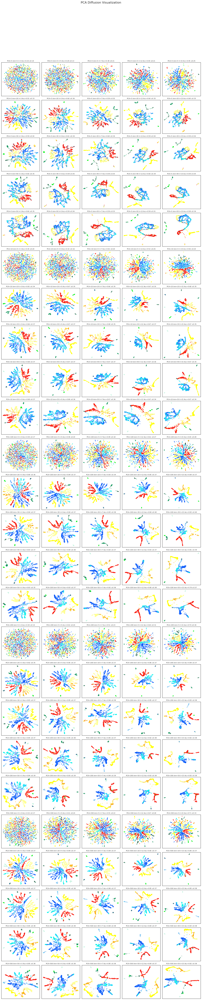

In [137]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pandas as pd
from sklearn.metrics import classification_report, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm
import umap
import s_gd2  # Assuming s_gd2 is available as a module
import itertools

def sgd(D, n_components=2, random_state=1, init=None, num_dimensions=None):
    N = D.shape[0]
    D = squareform(D)
    Y = s_gd2.mds_direct(N, D, init=init, random_seed=random_state)
    return Y

def pca_diffusion(data, n_components=10, knn=30, decay=15, t=5, random_state=1):
    pca = PCA(n_components=n_components, random_state=random_state)
    pca_data = pca.fit_transform(data)

    fit = umap.UMAP(n_components=20, n_neighbors=5, verbose=1, metric='cosine',
                    min_dist=0.5, n_epochs=521, negative_sample_rate=1, set_op_mix_ratio=0.6,
                    local_connectivity=1, learning_rate=1, random_state=42)
    umap_data = fit.fit_transform(pca_data)

    distance_matrix_dist = pdist(umap_data)
    distance_matrix_u_pca = squareform(distance_matrix_dist)

    n, m = distance_matrix_u_pca.shape
    E = np.zeros((m, m))

    knn_dst = np.sort(distance_matrix_u_pca, axis=1)
    epsilon = knn_dst[:, knn]

    pdx_scale = (distance_matrix_u_pca / epsilon).T
    E = np.exp(-1 * (pdx_scale ** decay))

    A = (E + E.T)

    diff_deg = np.diag(np.sum(A, 0))
    diff_op = np.dot(np.diag(np.diag(diff_deg) ** (-1)), A)

    new_matrix_pca_neuro = np.linalg.matrix_power(diff_op, t)

    distance_matrix_dist_neuro = pdist(new_matrix_pca_neuro)
    distance_matrix_pca_diff_neuro = squareform(distance_matrix_dist_neuro)

    PCA_diff_2D_MSD_sdg_neu = sgd(distance_matrix_pca_diff_neuro)

    return PCA_diff_2D_MSD_sdg_neu

def visualize_and_evaluate_pca_diffusion(data, cluster_data, combinations, decay=500, random_state=1, save_path='pca_diffusion_visualization.png', title='PCA Diffusion Visualization', dpi=300):
    cmap = ListedColormap(['#FFFF91', '#0055FA', '#1C67F9', '#3E7FFE', '#F91D12',
                           '#FFA900', '#6095FC', '#6FAB91', '#C3F2DE', '#0793F0',
                           '#397159', '#0E472E', '#FFFF00', '#7FC3F1',
                           '#E06A40', '#E9B22C', '#179860', '#FAF712',
                           '#03F216', '#14DEFA', '#03F2EB'])

    target = cluster_data['group']
    n_clusters = len(np.unique(target))
    list_clust = list(np.arange(n_clusters))
    lut = dict(zip(cluster_data['group'].unique(), list_clust))
    row_colors = target.map(lut)

    num_combinations = len(combinations)
    num_cols = 5
    num_rows = (num_combinations + num_cols - 1) // num_cols  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))
    axs = axs.flatten()

    with tqdm(total=num_combinations, desc="Visualizing PCA Diffusion") as pbar:
        for i, (pc, k, ti) in enumerate(combinations):
            umap_2d = pca_diffusion(data, n_components=pc, knn=k, decay=decay, t=ti, random_state=random_state)
            umap_df = pd.DataFrame(umap_2d, columns=['UMAP1', 'UMAP2'])

            # Fit KNN classifier using all data
            knn_classifier = KNeighborsClassifier(n_neighbors=30)
            knn_classifier.fit(umap_2d, target)

            # Make predictions using all data
            y_pred = knn_classifier.predict(umap_2d)

            # Calculate overall accuracy
            accuracy = accuracy_score(target, y_pred)

            # Calculate mean accuracy per class
            report = classification_report(target, y_pred, output_dict=True)
            accuracies = [report[str(cls)]['precision'] for cls in np.unique(target)]

            # Calculate overall mean accuracy and standard deviation
            mean_accuracy = np.mean(accuracies)
            std_dev_accuracy = np.std(accuracies)

            title_subplot = f'PCA={pc} $knn$={k} $t$={ti} Acc={accuracy:.2f} ±{std_dev_accuracy:.2f}'
            axs[i].scatter(umap_df['UMAP1'], umap_df['UMAP2'], c=row_colors, cmap=cmap, s=5)
            axs[i].set_title(title_subplot, fontsize=8)
            axs[i].set_xticks([])
            axs[i].set_yticks([])

            pbar.update(1)

    for j in range(num_combinations, num_rows * num_cols):
        fig.delaxes(axs[j])  # Remove empty subplots

    plt.tight_layout()
    fig.suptitle(title, fontsize=16)
    plt.subplots_adjust(top=0.92)  # Adjust title position
    plt.savefig(save_path, dpi=dpi)
    plt.show()

# Define combinations
pca_components = [5, 10, 100, 200, 500]
knn_values = [5, 20, 30, 40, 50]
t_values = [3, 5, 7, 12, 15]

# Generate all combinations
combinations = list(itertools.product(pca_components, knn_values, t_values))

# Example usage:
data = data  # Your input data
cluster_data = clusters_df
visualize_and_evaluate_pca_diffusion(data, cluster_data, combinations, decay=500, random_state=1, save_path='pca_umpa_diffusionmore_visualization_more.png', title='PCA Diffusion Visualization', dpi=300)
